In [2]:
import pandas as pd
import numpy as np
import scipy.stats as stats
import plotly.express as px

df1 = pd.read_csv('data/25_bank_transaction_HKB.csv').drop('Unnamed: 0', axis=1)
print(df1.shape)
df1.head(2)

(466526, 10)


,거래식별번호,Datetime,실측거리,거래금액,이체방식,이체은행,송금은행,거래계좌유형,이상거래여부,UserID
0,206813313,2024-06-14 22:00:10,NaN,29000.0,MP,KB국민은행,하나은행,정기예적금,0,123.087.0
1,206735755,2024-05-20 20:39:57,NaN,77000.0,MP,KB국민은행,KB국민은행,보통예금,0,184.087.0


In [3]:
df2 = pd.read_csv('data/25_mobile_trans_HKB.csv').drop('Unnamed: 0', axis=1)
print(df2.shape)
df2.head(2)

(512332, 6)


,거래식별번호,송금시간,수수료발생,기기일치,중복요청,UserID
0,206399224,13.0,1.0,1.0,NaN,315.087.0
1,206399225,NaN,NaN,NaN,NaN,325.087.0


In [4]:
# 1. 두 데이터를 불러와, 거래 식별 번호를 기준으로 데이터를 병합하여, 
# 고객의 거래 요청 데이터에 대해 이상 거래 여부를 판별하고자 한다. 
# 25_bank_transaction_HKB.csv 에 있는 Datetime 데이터에서 '거래월','거래일','거래요일','거래시간'을 추출하고, 
# 해당 데이터를 25_mobile_trans_HKB.csv 데이터와 병합하시오. 

df1['month'] = pd.to_datetime(df1['Datetime']).dt.month
df1['day'] = pd.to_datetime(df1['Datetime']).dt.day
df1['weekday'] = pd.to_datetime(df1['Datetime']).dt.day_name()
df1['time'] = pd.to_datetime(df1['Datetime']).dt.hour
df1.head(2)

,거래식별번호,Datetime,실측거리,거래금액,이체방식,이체은행,송금은행,거래계좌유형,이상거래여부,UserID,month,day,weekday,time
0,206813313,2024-06-14 22:00:10,NaN,29000.0,MP,KB국민은행,하나은행,정기예적금,0,123.087.0,6,14,Friday,22
1,206735755,2024-05-20 20:39:57,NaN,77000.0,MP,KB국민은행,KB국민은행,보통예금,0,184.087.0,5,20,Monday,20


In [5]:
df3 = pd.merge(df1, df2, on = ['거래식별번호', 'UserID'], how = 'inner')
print(df3.shape)
df3.head(2)

(404690, 18)


,거래식별번호,Datetime,실측거리,거래금액,이체방식,이체은행,송금은행,거래계좌유형,이상거래여부,UserID,month,day,weekday,time,송금시간,수수료발생,기기일치,중복요청
0,206813313,2024-06-14 22:00:10,NaN,29000.0,MP,KB국민은행,하나은행,정기예적금,0,123.087.0,6,14,Friday,22,NaN,1.0,1.0,1.0
1,206735755,2024-05-20 20:39:57,NaN,77000.0,MP,KB국민은행,KB국민은행,보통예금,0,184.087.0,5,20,Monday,20,NaN,1.0,1.0,1.0


In [6]:
df3['이상거래여부'].value_counts()

이상거래여부
0    390546
1     14144
Name: count, dtype: int64

In [7]:
# 2. 어떤 인자가 이상 거래에 있어 주요 판단을 내릴 수 있는 인자인가 확인하고자 한다.
# ‘실측거리’와 ‘거래금액’에 따라 '이상 거래 여부'의 유의미한 차이가 있는지 확인하시오.


In [8]:
# 3.  이상 거래와 정상 거래에 따른 '거래금액','실측거리','거래시간'의 평균과 중앙값을 비교하고, 
# 세 지표 중 이상거래와 정상거래에 따라 대표값의 유의미한 차이가 있는 인자를 가설검정을 통해 도출하시오.

df1.pivot_table(index='이상거래여부', values=['거래금액', '실측거리', 'time'], aggfunc=['mean', 'median', 'sum'])

mean                            median                     sum  \
             time           거래금액        실측거리   time     거래금액  실측거리     time   
이상거래여부                                                                        
0       13.882955  134586.156130  117.687793   16.0  68500.0   8.0  6249690   
1       13.327953  150170.478234  171.813519   16.0  75000.0  10.0   217992   

                                  
                거래금액        실측거리  
이상거래여부                            
0       6.058665e+10  21705395.0  
1       2.456188e+09    653235.0

In [9]:
# 이상 거래와 일반 거래의 거래금액의 대표값의 차이가 있는가?
cond1 = df3['이상거래여부'] == 1
df3_outlier = df3.loc[cond1]
df3_normal = df3.loc[~cond1]

# 귀무가설: 연속형 자료는 정규분포를 따른다.
# 대립가설: 정규분포를 따르지 않는다.

print(stats.normaltest(df3_normal['거래금액']))
print(stats.normaltest(df3_outlier['거래금액']))

NormaltestResult(statistic=835939.2579809447, pvalue=0.0)
NormaltestResult(statistic=16216.193646745915, pvalue=0.0)


In [10]:
stats.ranksums(df3_normal['거래금액'], df3_outlier['거래금액'])
# 귀무가설 참: 두 집단의 거래금액의 대표값의 차이는 없다.

RanksumsResult(statistic=-0.6299391344359789, pvalue=0.5287344072611507)

In [11]:
# 이상거래와 정상거래의 실측거리 대표값 시각화

p1 = df3.pivot_table(index = '이상거래여부', values='실측거리', aggfunc='mean').reset_index()
px.bar(p1, x = '이상거래여부', y = '실측거리')

In [12]:
# 4. 앞서 도출된 유의미한 인자들 간, 이상거래에 해당하는 자료들만 뽑아, 상관 계수 (Correlation)을 계산하시오.

df3.describe()

,거래식별번호,실측거리,거래금액,이상거래여부,month,day,time,송금시간,수수료발생,기기일치,중복요청
count,4.046900e+05,160700.000000,4.046900e+05,404690.000000,404690.000000,404690.000000,404690.000000,220912.000000,208363.000000,208363.000000,155444.000000
mean,2.066554e+08,120.037735,1.348552e+05,0.034950,4.383518,15.449633,13.833606,28.689791,0.999904,0.895792,0.843590
std,1.478946e+05,372.963388,2.399084e+05,0.183654,1.526546,8.501395,7.648867,62.405538,0.009797,0.305530,0.363245
min,2.063992e+08,0.000000,2.510000e+02,0.000000,2.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2.065274e+08,3.000000,4.328800e+04,0.000000,3.000000,8.000000,6.000000,1.000000,1.000000,1.000000,1.000000
50%,2.066555e+08,8.000000,6.895000e+04,0.000000,4.000000,16.000000,16.000000,8.000000,1.000000,1.000000,1.000000
75%,2.067834e+08,25.000000,1.250000e+05,0.000000,6.000000,22.000000,20.000000,27.000000,1.000000,1.000000,1.000000
max,2.069116e+08,10286.000000,3.193739e+07,1.000000,7.000000,31.000000,23.000000,749.000000,1.000000,1.000000,1.000000


In [13]:
df4 = df3[['실측거리', 'time', '송금시간', '거래금액']].dropna()

In [14]:
for i in df4.columns:
    print(i)
    print(stats.normaltest(df4[i]).pvalue)

실측거리
0.0
time
0.0
송금시간
0.0
거래금액
0.0


In [15]:
df4.corr(method='spearman')

,실측거리,time,송금시간,거래금액
실측거리,1.000000,0.013253,-0.036939,0.005460
time,0.013253,1.000000,-0.021454,0.012919
송금시간,-0.036939,-0.021454,1.000000,-0.003676
거래금액,0.005460,0.012919,-0.003676,1.000000


In [16]:
# 5. 거래시간을 아래와 같이 분류하여, 시간대 별 이상거래에 대한 분석을 하고자 한다. 아래의 기준을 이용해, 거래시간을 분류해 '시간대'라는 파생변수를 생성하시오.
#     - 오전 6시 ~ 10시 전 : 아침
#     - 오전 10시 ~ 오후 1시 전 : 오전
#     - 오후 1시 ~ 오후 5시 전 : 오후
#     - 오후 5시 ~ 오후 9시 전 : 저녁
#     - 오후 9시 ~ 자정 전 : 밤
#     - 자정 ~ 오전 6시 전 : 새벽

def func1(row):
    if row >= 21:
        return 'night'
    elif row >= 17:
        return 'evening'
    elif row >= 13:
        return 'pm'
    elif row >= 10:
        return 'am'
    elif row >= 6:
        return 'morning'
    return 'dawn'

df3['시간대'] = df3['time'].apply(func1)
df3['시간대'].value_counts()

시간대
evening    114646
dawn        99475
night       84475
pm          81388
am          14340
morning     10366
Name: count, dtype: int64

In [17]:
# 6. 시간대에 따라 이상거래와 정상거래의 비율이 달라진다고 볼 수 있는지, 시간대 별, 이상거래의 비율을 계산하고, 가설 검정을 통해 각 시간대 별 이상거래 비율이 달라지는지 규명하시오.
# 시간대(범주형 - 서열) / 이상거래여부(범주형)
pd.crosstab(df3['시간대'], df3['이상거래여부'], normalize='index')

이상거래여부,0,1
시간대,,
am,0.962483,0.037517
dawn,0.962071,0.037929
evening,0.965729,0.034271
morning,0.908740,0.091260
night,0.965777,0.034223
pm,0.974603,0.025397


In [18]:
# 귀무가설: 시간대와 이상거래여부는 서로 독립이다
# 대립가설: 시간대와 이상거래여부는 서로 독립이 아니다.
c1 = pd.crosstab(df3['시간대'], df3['이상거래여부'])
stats.chi2_contingency(c1).pvalue
# 서로 독립이 아니다

5.119515192963649e-263

In [19]:
# 7. 전체 거래 중, 이상거래의 비율이 가장 많은 은행을 확인하고, 해당 은행에서 이상 거래가 어느 시간대, 
# 어떤 은행으로 이체가 가장 많이 발생했는지 확인하시오.

c2 = pd.crosstab(df3['이체은행'], df3['이상거래여부'], normalize='index')
c2.sort_values(by = 1, ascending=False).head(5)

이상거래여부,0,1
이체은행,,
신한은행,0.872834,0.127166
씨티은행,0.907743,0.092257
우리은행,0.919321,0.080679
HSBC은행,0.930818,0.069182
수협은행,0.935294,0.064706


In [20]:
cond1 = df3['이체은행'] == '신한은행'
cond2 = df3['이상거래여부'] == 1
df5 = df3.loc[cond1 & cond2]
df5['시간대'].value_counts()

시간대
dawn       1712
evening    1271
night       922
pm          493
morning     467
am           95
Name: count, dtype: int64

In [21]:
cond3 = df5['시간대'] == 'dawn'
df5.loc[cond3]['송금은행'].value_counts().head(2)

송금은행
IBK기업은행    433
신한은행       413
Name: count, dtype: int64

In [22]:
# 8. 이상거래의 비율이 가장 많은 이체방식과, 가장 적은 이체방식에서의 '거래시간'의 분포를 histogram으로 비교하시오.
pd.crosstab(df3['이체방식'], df3['이상거래여부'], normalize='index')

이상거래여부,0,1
이체방식,,
AT,0.886093,0.113907
CCT,0.963089,0.036911
DD,0.937017,0.062983
MP,0.979352,0.020648
RP,0.952456,0.047544


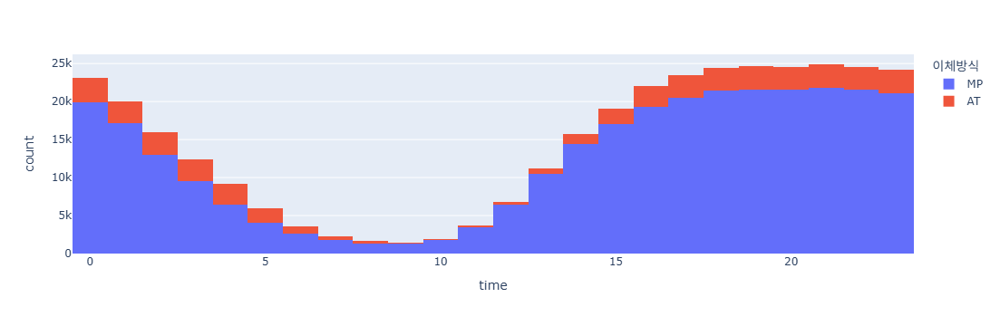

In [23]:
cond1 = df3['이체방식'].isin(['AT', 'MP'])
px.histogram(df3.loc[cond1], x = 'time', color= '이체방식')

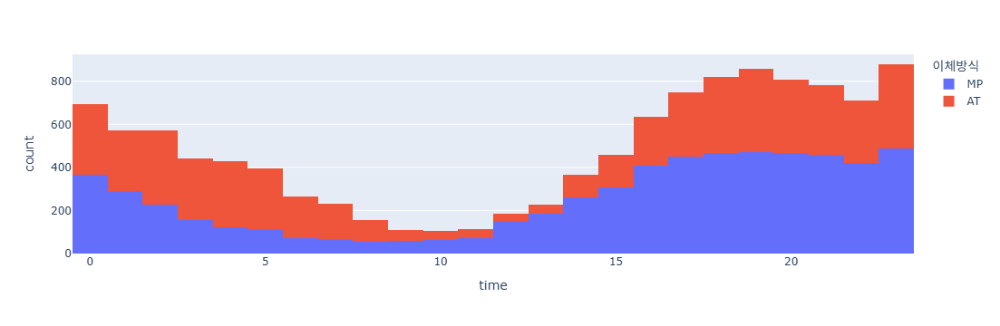

In [24]:
cond1 = df3['이체방식'].isin(['AT', 'MP'])
cond2 = df3['이상거래여부'] == 1
px.histogram(df3.loc[cond1 & cond2], x = 'time', color= '이체방식')

### Ensemble
- 앙상블 (Ensemble) : 여러개의 모델을 결합 / 모델에 의한 결과를 종합하여 단일 모델 대비 성능을 높인 알고리즘들의 종류
  - 전체 데이터에서 적절한 표본추출로 여러개의 훈련용 데이터를 만들어, 해당 데이터를 서로다른 모델이 학습
  - 여러 모델이 하나의 데이터에 학습 결과를 가중 투표(Weighted Vote)하여 학습
  - 이전 모델의 오차를 점진적으로 줄여나가는 방식으로 파라미터를 개선하여 모델을 학습
- 종류
  1. 보팅 (Voting) : 하나의 학습 데이터에서 여러종류의 모델을 사용해, 결과를 결합, 최우수 모델을 선택
  2. 배깅 (Bagging): 복원추출 과정을 통해, 학습 데이터에서 추출된 여러 sub sample에 대해 단일 모델을 반복적으로 학습시켜 결과를 결합, 최적모델 선택
  3. 부스팅 (Boosting) : 이전 모델의 학습 결과를 다음 복원추출에 반영, 점진적으로 모델을 개선
  4. 스택 (Stacking) : 모델의 예측 결과를 모아 새로운 x로 선언한 뒤, 해당 x를 학습하여 예측

### random forest(bagging)

- 여러개의 결정트리 모델을 묶어 과적합을 방지하고, 무작위 추출 및 복원 추출을 활용해 성능을 높이는 형식의 알고리즘
- bagging + random selection (x 변수를 무작위로 선택)
- 원리:
  - bootstrap sampling
    - 원본 데이터에서 복원추출(sub-sampling)을 통해 여러개의 부트스트랩 샘플을 생성
    - 각 부트스트랩 샘플을 트리 알고리즘이 학습
  - random feature selection
    - 각 트리가 학습을 수행할 때, 무작위로 선택된 일부의 x만 사용하여 node를 분할
    - 각 트리가 서로 다른 특성을 학습하므로, 다양성이 증대되고, overfitting 방지
  - multiple decision tree
    - 다수의 의사결정 나무 알고리즘을 사용
    - 선택된 x에 대한 특성을 이용하여 node가 분할 -> 최종적으로는 가장 분류기준이 좋은 tree를 선택
  - voting or averaging:
    - 분류 모델에서는 다수결 투표를 통해, 각 트리의 예측 겨로가를 결합하여 최종 예측
    - 회귀 모델에서는 각 트리의 예측값의 평균을 계산하여 예측

In [27]:
from sklearn.ensemble import RandomForestClassifier

- **RF Model HyperParameter (scikit-learn)**
- n_estimators : 의사결정 나무 모델의 개수를 지정 / RF에서 생성할 트리 개수를 결정 / 일반적으로는 해당 값이 높을 수록 모델의 성능은 향상 / 기본값 100 (Bagging) 
- criterion : 트리 알고리즘 내 최적화 기법을 선택 (기본값 Gini / Entropy)
- max_depth : 트리의 최대 깊이 / 과적합을 방지하기 위해 트리 깊이를 제한 (기본값 None)
- min_samples_split : Node를 분할하기 위한 최소 Data 수 / 해당 수보다 작은 데이터가 있다면, 분할을 중단 (기본값 2)
- min_samples_leaf : Leaf 노드가 되기 위한 최소 데이터 수 / 이 값보다 작은 수의 데이터가 있는 Node는 더이상 분할 되지 않음
- max_features : 각 Node에서 고려할 X변수의 최대 갯수 지정 / 기본값 auto - X변수 개수의 제곱근 만큼 특성을 반영 / X Columns 개수 :9 -> 3개의 X를 반영해 Tree 구성

In [43]:
# 9. 트리 모델을 활용하여, 이상거래탐지 분류모델을 생성하시오.
#     - X : '실측거리' / '거래금액' / '이체방식' / '거래계좌유형' / '거래일' / '거래요일' / '거래시간' / '송금시간' / '수수료발생' / '기기일치' / '중복요청'
#     - 학습과 특성공학 기법이 같이 적용
#     - 하이퍼파라미터 튜닝에 의한 모델링 횟수가 50회 이상 넘지 않도록 설정
#     - 성능 평가 실시
#     - Threshold Tuning을 이용해 F1 성능 개선

# 변수 설정 
X = df3[['실측거리','거래금액','이체방식','거래계좌유형','weekday', 'time', 'day',
         '송금시간','수수료발생','기기일치','중복요청']]
Y = df3['이상거래여부']
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X,Y, test_size=0.3, random_state=1234)

In [44]:
from imblearn.pipeline import make_pipeline
from sklearn.compose import make_column_transformer
from sklearn.impute  import SimpleImputer # 범주형 - 최빈값 
from sklearn.impute  import KNNImputer, SimpleImputer # 연속형 - KNN 알고리즘 활용 대치 
from sklearn.preprocessing import OneHotEncoder # 범주형 데이터 -> 1/0 처리 
from sklearn.ensemble import RandomForestClassifier # 학습 알고리즘 
from sklearn.model_selection import GridSearchCV # 교차검증 + 하이퍼파라미터 튜닝(Gird) 
from sklearn.metrics import classification_report # 평가 
from sklearn.metrics import precision_recall_curve # Threshold에 따른 F1 값 확인 
from sklearn.preprocessing import Binarizer # 최적의 F1값을 계산하기 위해 Threshold 조정 

In [48]:
# 파이프라인 구성 
pipe1 = make_pipeline( SimpleImputer(strategy='median') ) # 연속형 자료 처리 
pipe2 = make_pipeline( SimpleImputer(strategy='constant',fill_value=0)) # 범주형 자료 처리 
pipe3 = make_pipeline( SimpleImputer(strategy='most_frequent'), 
                       OneHotEncoder(handle_unknown='ignore')) # 범주형(문자) 자료 처리 
list1 = ['실측거리','거래금액','day','time','송금시간']
list2 = ['수수료발생','기기일치','중복요청']
list3 = ['이체방식','거래계좌유형','weekday']

In [49]:
# 각각의 파이프를 병렬로 처리 
pipe4 = make_column_transformer( (pipe1, list1), (pipe2, list2), (pipe3, list3) )
pipe4.fit(X_train, Y_train)

ColumnTransformer(transformers=[('pipeline-1',
                                 Pipeline(steps=[('simpleimputer',
                                                  SimpleImputer(strategy='median'))]),
                                 ['실측거리', '거래금액', 'day', 'time', '송금시간']),
                                ('pipeline-2',
                                 Pipeline(steps=[('simpleimputer',
                                                  SimpleImputer(fill_value=0,
                                                                strategy='constant'))]),
                                 ['수수료발생', '기기일치', '중복요청']),
                                ('pipeline-3',
                                 Pipeline(steps=[('simpleimputer',
                                                  SimpleImputer(strategy='most_frequent')),
                                                 ('onehotencoder',
                                                  OneHotEncoder(handle_unknown='ignore'))]),
                                 ['이체방식', '거래계좌유형', 'weekday'])])

In [50]:
model_pipe = make_pipeline(pipe4, RandomForestClassifier())

# 하이퍼파라미터 튜닝 및 교차검증

hyper = {'randomforestclassifier__n_estimators':[200],
        'randomforestclassifier__max_depth':[3, 5, 10],
        'randomforestclassifier__min_samples_split':[20, 40, 60],
        'randomforestclassifier__class_weight':['balanced'],
        'randomforestclassifier__criterion':['entropy']}
grid_model = GridSearchCV(model_pipe, param_grid=hyper, cv=3, n_jobs=-1, scoring='f1')
grid_model.fit(X_train, Y_train)
best_model = grid_model.best_estimator_

In [51]:
Y_train_pred = best_model.predict(X_train)
Y_test_pred = best_model.predict(X_test)

In [52]:
print(classification_report(Y_train, Y_train_pred))
print(classification_report(Y_test, Y_test_pred))

              precision    recall  f1-score   support

           0       0.99      0.77      0.87    273346
           1       0.11      0.76      0.19      9937

    accuracy                           0.77    283283
   macro avg       0.55      0.76      0.53    283283
weighted avg       0.96      0.77      0.84    283283

              precision    recall  f1-score   support

           0       0.99      0.77      0.86    117200
           1       0.10      0.71      0.17      4207

    accuracy                           0.77    121407
   macro avg       0.54      0.74      0.52    121407
weighted avg       0.96      0.77      0.84    121407



In [53]:
df_importance = pd.DataFrame()
df_importance['X'] = best_model['columntransformer'].get_feature_names_out()
df_importance['Importance'] = best_model['randomforestclassifier'].feature_importances_

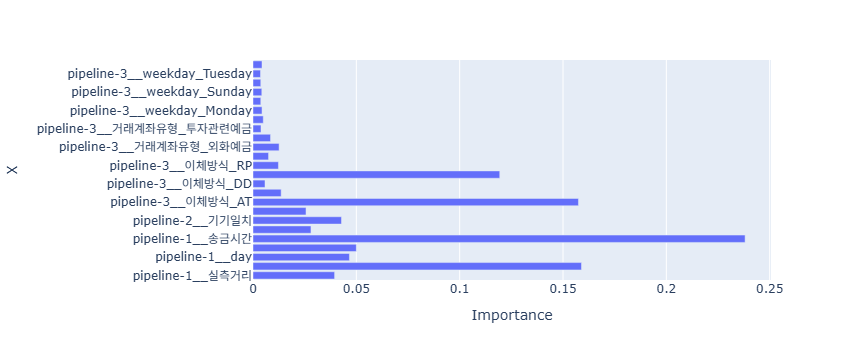

In [54]:
px.bar(df_importance, x = 'Importance', y = 'X')

### permutation importance (순열 중요도)

- 알고리즘중에 비선형 모델 (선형회귀- 회귀계수, 트리 - 변수중요도)
- 각 X 변수를 무작위로 섞어 모델에 성능이 변화하는지를 판단하여, y에 중요하게 작용하는 인자가 무엇인지 수치로 나타낸 지표
- 비선형 알고리즘, 앙상블 알고리즘 등에 사용
- 모든 유형의 머신러닝 모델에 사용이 가능(모델 간 x변수의 특성이 목표변수에 어떤 영향을 주는지 비교할 때 주로 사용)
- 

In [55]:
from sklearn.inspection import permutation_importance

In [56]:
result = permutation_importance(best_model, X_train, Y_train, n_repeats=3, random_state=1234)

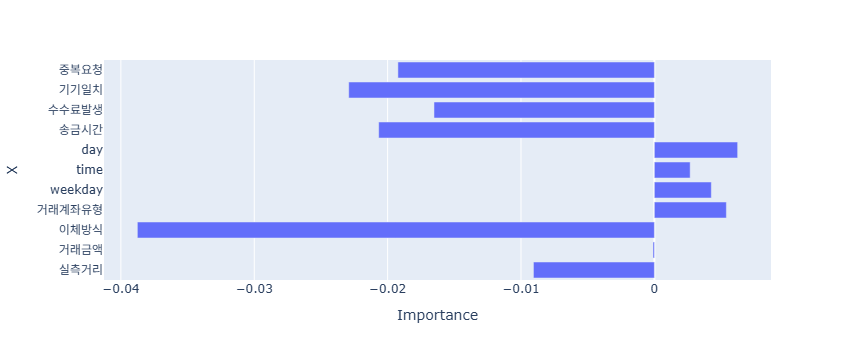

In [58]:
df_pi = pd.DataFrame()
df_pi['Importance'] = result.importances_mean
df_pi['X'] = X.columns
px.bar(df_pi, x='Importance', y='X')

- 랜덤 포레스트 모델 트리 확인

In [61]:
tree_group = best_model['randomforestclassifier'].estimators_
len(tree_group)

200

In [62]:
# 200개의 RF 알고리즘 내 트리 중, 첫 번째 트리
tree1 = tree_group[0]

In [64]:
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rc('font', family = 'Malgun Gothic')

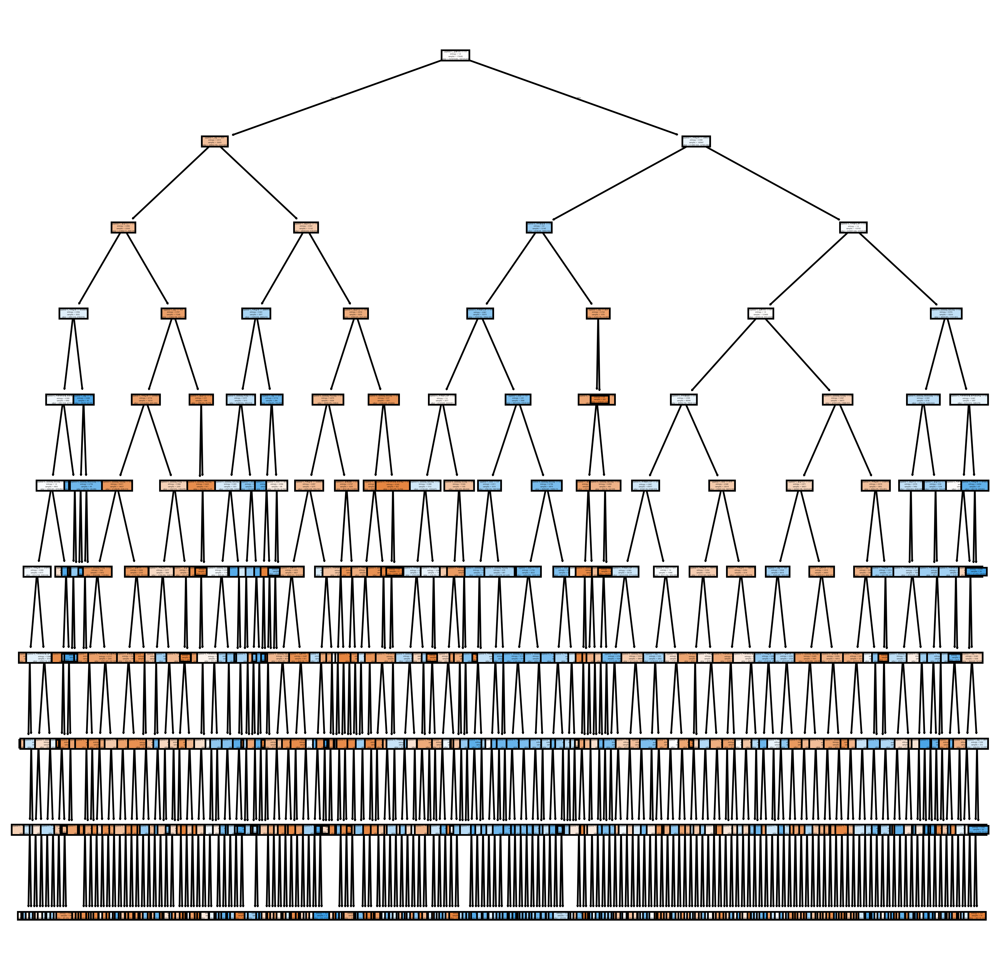

In [66]:
plt.figure(figsize = [10, 10], dpi = 500)
plot_tree(tree1, filled=True, feature_names=best_model['columntransformer'].get_feature_names_out())
plt.show()

In [26]:
# 10. 앞서 만든 모델의 변수 중요도에서 높게 나온 인자를 확인하시오.

- threshold tuning: 분류에 있어서, 목표변수의 클래스의 확률값을 계산해, 확률값이 가장 큰 클래스로 데이터를 분류, 분류를 함에 있어 확률값의 기준 threshold
- 이진분류에 있어서 기본값: 50%

In [69]:
Y_proba_test = best_model.predict_proba(X_test)[:, 1]# 이상거래로 분류될 확률값을 각 x에 대해서 계산
Y_proba_test

array([0.16143868, 0.19379263, 0.16857788, ..., 0.15322212, 0.27603704,
       0.20696426])

In [70]:
# precision 지표와 recall 지표가 각 threshold가 변함에 따라 어떻게 측정 되는지 확인
# 가장 적정한 threshold 도출
precision, recall, threshold = precision_recall_curve(Y_test, Y_proba_test)
print(precision, recall, threshold)

[0.03465204 0.03465232 0.03465261 ... 1.         1.         1.        ] [1.00000000e+00 1.00000000e+00 1.00000000e+00 ... 9.50796292e-04
 7.13097219e-04 0.00000000e+00] [0.06267327 0.06490001 0.0688083  ... 0.85778877 0.86261846 0.86498205]


In [72]:
# 각 threshold에 따른 precision과 recall값을 데이터 프레임으로 선언
df_curve = pd.DataFrame()
df_curve['threshold'] = threshold
df_curve['reacll'] = recall[:-1]
df_curve['precision'] = precision[:-1]
df_curve

,threshold,reacll,precision
0,0.062673,1.000000,0.034652
1,0.064900,1.000000,0.034652
2,0.068808,1.000000,0.034653
3,0.068928,1.000000,0.034653
4,0.071595,1.000000,0.034653
...,...,...,...
115589,0.854551,0.001664,1.000000
115590,0.855163,0.001426,1.000000
115591,0.857789,0.001188,1.000000
115592,0.862618,0.000951,1.000000


In [74]:
p1 = df_curve.melt(id_vars=['threshold'])
# px.line(p1, x='threshold', y = 'value', color='variable')

In [75]:
y_proba_test_col = Y_proba_test.reshape(-1, 1)
y_new_test_pred = Binarizer(threshold=0.765).fit_transform(y_proba_test_col)

In [76]:
print(classification_report(Y_test, y_new_test_pred))

              precision    recall  f1-score   support

           0       0.97      0.97      0.97    117200
           1       0.22      0.22      0.22      4207

    accuracy                           0.95    121407
   macro avg       0.60      0.60      0.60    121407
weighted avg       0.95      0.95      0.95    121407



### Boosting Model

- 복원 추출과정에서 이전에 학습의 결과를 반영하여, 오차가 줄어드는 방향으로 (최적화, 경사하강법) 새로운 복원추출되는 데이터에 대해 가중치를 부여하여 학습
- 종류
  1. Ada Boosting(Adaptive Boosting)
     - 이전에 학습의 결과에서 잘 반영되지 않은 데이터에 대해 가중치를 더하여 복원추출을 수행
     - 분류로 예를 들면, 앞서 분류를 적절히 수행하지 못한 데이터에 대해 가중치를 주며 학습
     - 데이터에 이상치가 존재하는 경우, 이상치에 대해 지속적으로 weight 부여하여 모델이 구성
     - 사전에 구성 데이터가 깔끔하지 않다면, 지속적 학습에 대해 개선이 되지 않을 가능성이 높음
  2. Gradient Boosting
     - 모델에 이상치가 있거나, 너무 높게 부여된 weight에 대해 주변 데이터가 오분류될 가능성을 극복하고자, 분류 결과에 가중치를 부여할 때 마다, 오차가 줄어드는 방향으로 weight 계산(경사하강법)
     - Ada boosting모델 보다 비교적 오차에 민감한 모델을 구성
     - 복원추출된 데이터에 대해 학습한 모델의 오차를 최적화 기법으로 갱신 -> 시간 소요
     - 순차적으로 학습이 진행되므로, 나중에 학습된 분류선에 대해서는 과적합 발생
  3. XGBoosting
     - gradient boosting알고리즘에서 발생하는 과적합 현상을 방지하기 위해, 규제항(regularization)을 추가하여 학습을 수행
     - 복원 추출된 데이터의 오차가 줄어들게 끔 학습을 지속적으로(순차적으로)하다보면, tree가 굉장히 복잡해지는 현상이 발생
     - weight를 계산할 때 규제항을 추가하여 과적합을 방지
     - 시간이 매우 오래걸림
  4. Light Boosting
     - boosting 계열 알고리즘들이 복원 추출된 데이터를 순차적으로 학습을 수행 -> 시간이 오래 소요
     - 복원 추출된 데이터의 양을 조절하는 알고리즘을 이용해 시간과 자원을 효과적으로 개선
     - 복원 추출된 데이터의 근사치를 이용하여 데이터의 양을 조절하고, 학습을 점전적으로 수행
  5. Cat Booting(Categorical Booting)
     - x에 대한 복원 추출 시, 범주형 데이터에 대해 학습이 원할히 이뤄질 수 잇도록, encoding최적화를 수행하여 학습을 점진적으로 수행